# 데이터 수집 (API 및 웹스크랩핑)

## 1. 주식 데이터

셀 1.1 코드 출처: [링크](https://joycecoder.tistory.com/107)

In [ ]:
# 1.1 네이버에서 주식 데이터 가져오기
from urllib import parse
from ast import literal_eval
import requests

def get_sise(code, start_time, end_time, time_from='day'):
    get_param = {
    	'symbol':code,
	    'requestType':1,
	    'startTime':start_time,
	    'endTime':end_time,
	    'timeframe':time_from
    }
    get_param = parse.urlencode(get_param)
    url="https://api.finance.naver.com/siseJson.naver?%s"%(get_param)
    response = requests.get(url, verify=False)
    return literal_eval(response.text.strip())

get_sise('033640', '20240224', '20240229', 'day')

셀 1.2 코드 출처: 챗GPT

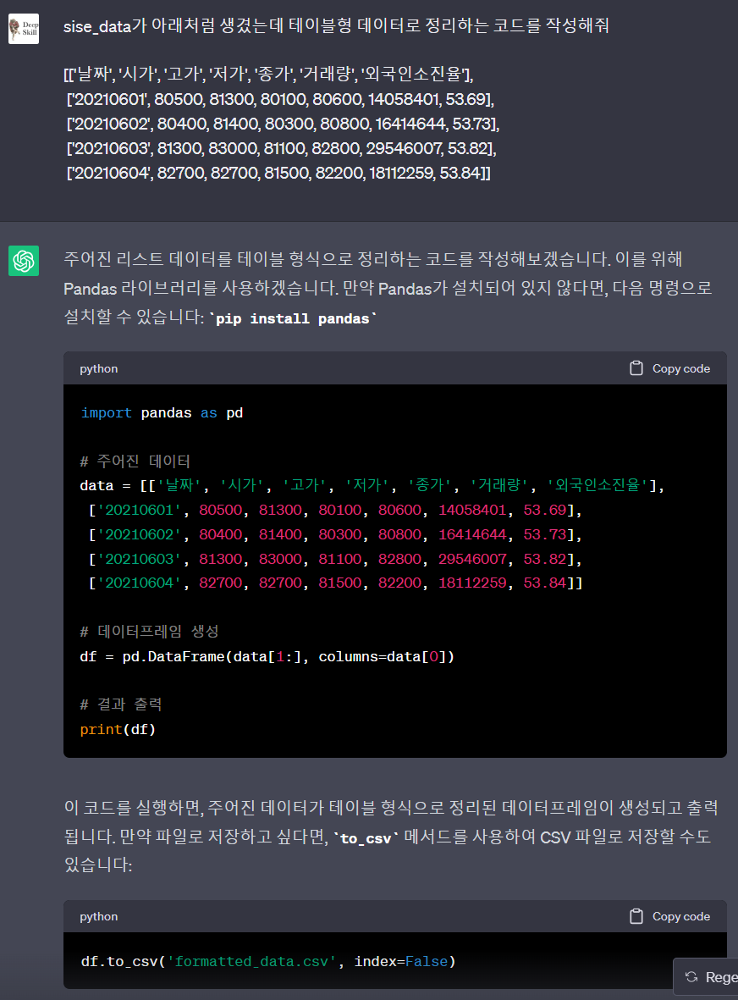{width=60%}

In [ ]:
# 1.2 데이터로 정리
sise_data = get_sise('033640', '20230501', '20230830', 'day')

import pandas as pd
df = pd.DataFrame(sise_data[1:], columns=sise_data[0])
df.head()

# QUIZ: 결과 데이터프레임을 엑셀로 저장하려면?

## 2. 네이버 검색 데이터

API란? 빨대를 꽂는다!

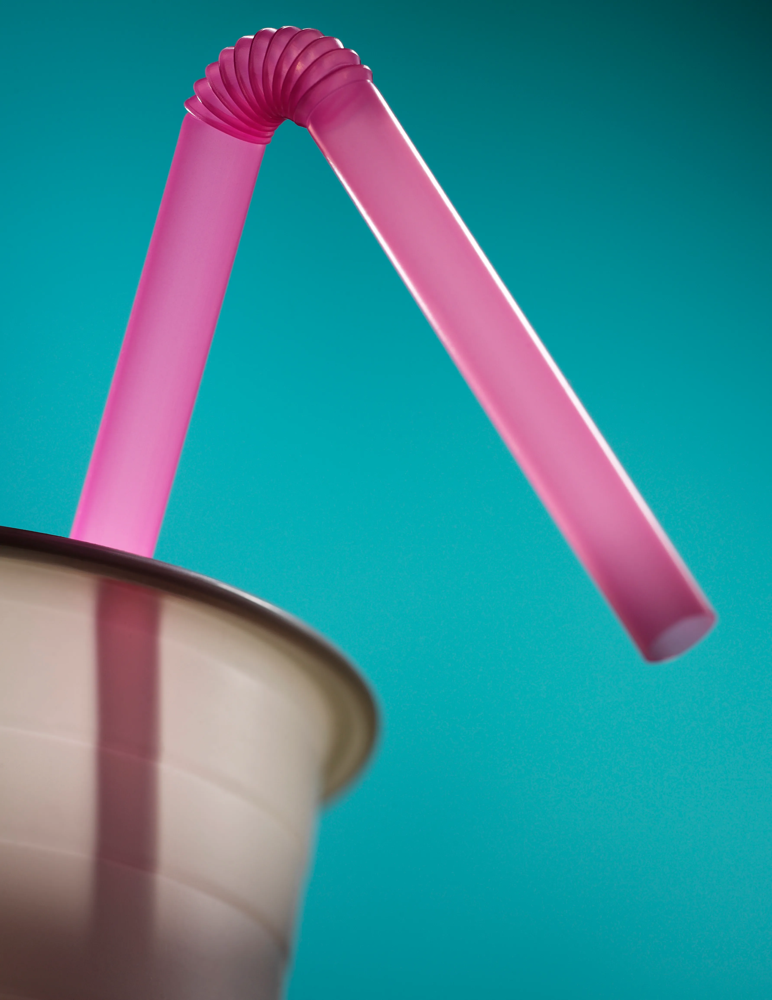{width=30%}

참고: [링크](https://developers.naver.com/docs/serviceapi/datalab/search/search.md)

In [ ]:
# 1.3 외부데이터(네이버)를 추출한 예시 (참조용)

import pandas as pd
import requests

# 참고: https://developers.naver.com/docs/serviceapi/datalab/search/search.md

# 요청 변수 설정
url = "https://openapi.naver.com/v1/datalab/search"
headers = {
    "X-Naver-Client-Id": "G_GVBQo_m2of702ccDmR",
    "X-Naver-Client-Secret": "<Secret Key로 교체해야 함>",
    "Content-Type": "application/json"
}

data = {
    "startDate": "2023-01-01",
    "endDate": "2023-08-28",
    "timeUnit": "week",
    "keywordGroups": [
        {
            "groupName": "반도체",
            "keywords": ["반도체"]
        }
    ]
}

response = requests.post(url, headers=headers, json=data, verify=False)
result = response.json()

# result
pd.DataFrame(result["results"][0]["data"])

출처: 챗GPT

위의 API [문서](https://developers.naver.com/docs/serviceapi/datalab/search/search.md)를 참조

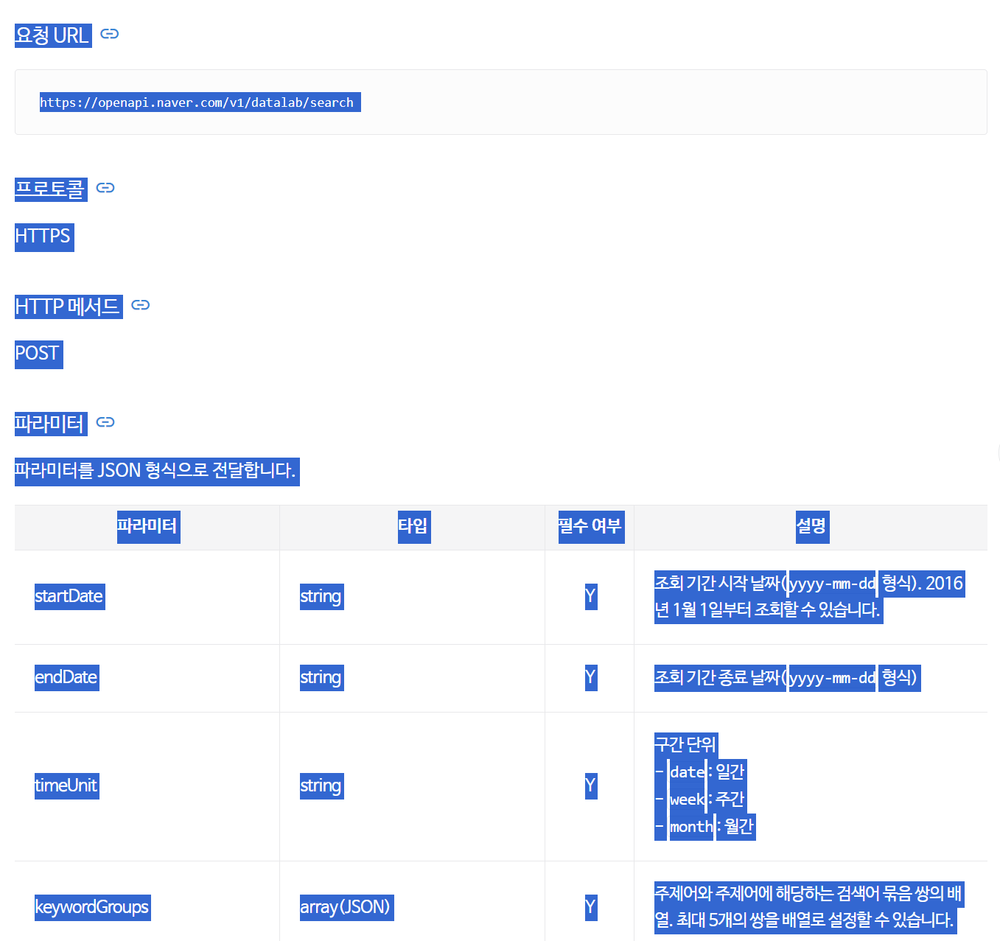{width=40%}

챗GPT에 질문

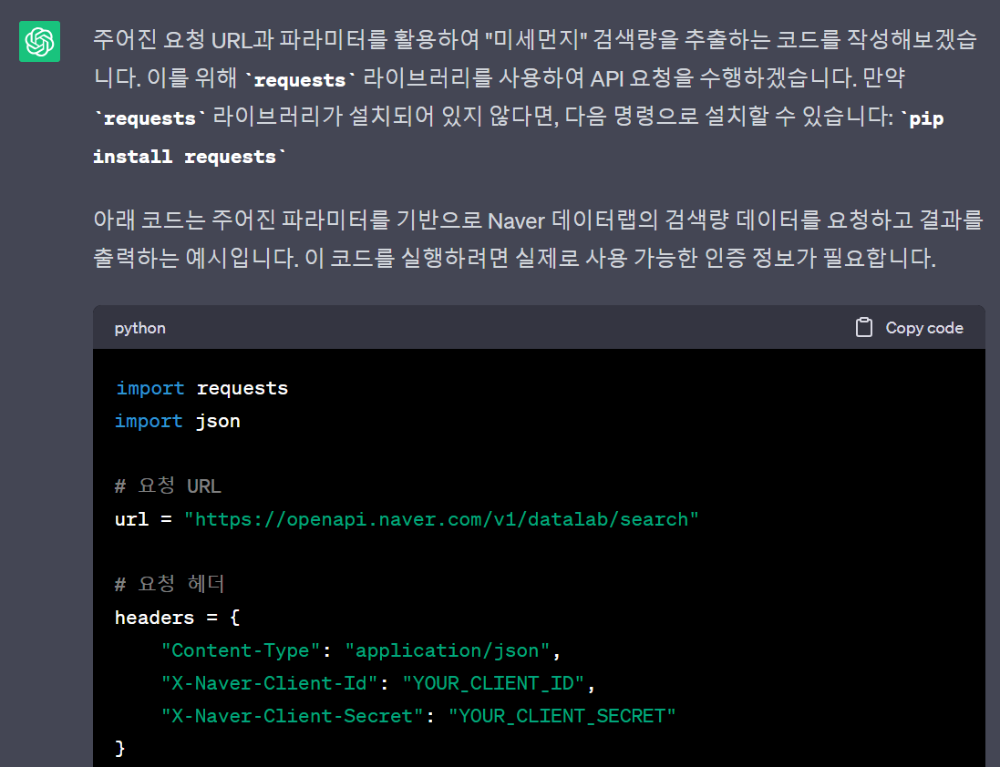{width=40%}

## 3. 공공데이터포털

참고 [블로그](https://whiseung.tistory.com/entry/KOSIS%EA%B5%AD%EA%B0%80%ED%86%B5%EA%B3%84%ED%8F%AC%ED%84%B8-%ED%86%B5%EA%B3%84%EC%9E%90%EB%A3%8C-openAPI-%EC%82%AC%EC%9A%A9)

In [ ]:
import json
from urllib.request import urlopen

kosis_api_key = "<KOSIS API Key로 대체해야 함>"

with urlopen(f"https://kosis.kr/openapi/Param/statisticsParameterData.do?method=getList&apiKey={kosis_api_key}&itmId=13103882359I115100001+&objL1=13102882359I161150002+&objL2=&objL3=&objL4=&objL5=&objL6=&objL7=&objL8=&format=json&jsonVD=Y&prdSe=Q&newEstPrdCnt=3&orgId=115&tblId=DT_115100004") as url:
    json_file = url.read()
    py_json = json.loads(json_file.decode("utf-8"))

pd.DataFrame(py_json)

## 4. 웹스크롤링

In [ ]:
# 1.4

import requests
from bs4 import BeautifulSoup

# 웹페이지 URL
url = 'https://ko.wikipedia.org/wiki/삼성전자'

# 웹페이지 요청
response = requests.get(url)

# 웹페이지의 HTML 내용을 파싱
soup = BeautifulSoup(response.content, 'html.parser')

# 웹페이지의 제목 태그를 찾고 내용을 출력
title = soup.find('title')
print(f'Page Title: {title.string}')

# 웹페이지 내에서 특정 제목 태그(h1, h2, ...) 아래에 있는 텍스트를 출력
for header in soup.find_all(['h1', 'h2', 'p']):
    print(header.text)

# 'p' 태그에 들어 있는 첫 번째 문단의 텍스트를 출력
first_paragraph = soup.find('p')
print(first_paragraph.text)


코드 출처: 챗GPT "한국 위키피디아에서 코웨이 페이지를 스크랩핑하려면?"